In [1]:
import pandas as pd
import warnings
import numpy as np
import seaborn as sns
warnings.filterwarnings("ignore")
X_train=pd.read_csv('XESTrainTrans.csv')
X_test=pd.read_csv('XESTestTrans.csv')
y_train=pd.read_csv('yESTrainTrans.csv')
y_test=pd.read_csv('yESTestTrans.csv')

In [2]:
X_train.columns[:18]

Index(['Latitude', 'Longitude', 'ENERGYSTARScore', 'CouncilDistrictCode',
       'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA',
       'BuildingType_0', 'BuildingType_1', 'BuildingType_2', 'BuildingType_3',
       'BuildingType_4', 'BuildingType_5'],
      dtype='object')

In [5]:
numeric=['Latitude', 'Longitude', 'ENERGYSTARScore', 'CouncilDistrictCode',
       'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA']

## Etudes des variables correlees entre elles

In [6]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X_train[numeric], 0.80)
print('correlated features: ', len(set(corr_features)) )

correlated features:  2


In [7]:
corr_features

{'LargestPropertyUseTypeGFA', 'PropertyGFABuilding(s)'}

In [8]:
X_train=X_train.drop(columns=corr_features)
X_test=X_test.drop(columns=corr_features)

## On travaille sur la prediction de l'emission de CO2

In [9]:
y_train.columns

Index(['SiteEnergyUse(kBtu)', 'TotalGHGEmissions'], dtype='object')

In [10]:
y_emissions=y_train['TotalGHGEmissions']

In [11]:
y_test_emissions=y_test['TotalGHGEmissions']

# Regressions lineaires
Nous allons commencer notre etudes des methodes de predictions des methodes les plus simples vers les plus performentes. Nous commencerons donc par les regressions lineaires

## 1- Dummy regression
On commence par cette regression qui predira uniquement la moyenne (c'est la pire regression possible et nous donnera donc une baseline)

In [12]:
import timeit
from sklearn import dummy
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
dum = dummy.DummyRegressor(strategy='mean')

In [13]:
score=pd.DataFrame()


In [14]:
score.loc['Model',0]='Dummy'
start_time = timeit.default_timer()
dum.fit(X_train, y_emissions)
y_pred_dum = dum.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time',0]=elapsed
print ("The time of execution is {:.5f}s".format(elapsed))

The time of execution is 0.00415s


In [15]:
def get_score(y, ypred,i):
    mse=mean_squared_error(y, ypred)
    score.loc['MSE', i]=mse
    print("MSE : {:.2f}".format(mse))
    rmse=np.sqrt(mse)
    score.loc['RMSE',i]= rmse
    print("RMSE : {:.2f}".format(rmse))
    mae=mean_absolute_error(y,ypred)
    score.loc['MAE', i]= mae
    print("MAE : {:.2f}".format(mae))


In [16]:
get_score(y_test_emissions, y_pred_dum,0)

MSE : 1.01
RMSE : 1.01
MAE : 0.79


In [17]:
score

,0
Model,Dummy
Time,0.004153
MSE,1.011888
RMSE,1.005927
MAE,0.789164


In [18]:
def get_r2(model,X,y,i):
    score.loc['R2',i]= model.score(X, y)
    print("R2 : {:.5f}".format(model.score(X, y)))

In [19]:
get_r2(dum, X_test, y_test_emissions,0)

R2 : -0.01073


## Conclusion: 
Dummy Regression nous donne le pire scenario, on voit bien q'avec un R2 negatif et des erreurs assez grande, ce model ne donne pas d'informations sur les predictions

## 2- Linear regression

In [20]:
score.loc['Model', 1]='Linear Regression'
from sklearn import linear_model
start_time = timeit.default_timer()
lr = linear_model.LinearRegression()
lr.fit(X_train,y_emissions)
y_pred_base=lr.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time', 1]=elapsed
print ("The time of execution is {:.5f}s".format(elapsed))

The time of execution is 0.14830s


In [21]:
get_score(y_test_emissions, y_pred_base,1)

MSE : 0.22
RMSE : 0.47
MAE : 0.37


In [22]:
get_r2(lr,X_test, y_test_emissions,1)

R2 : 0.78256


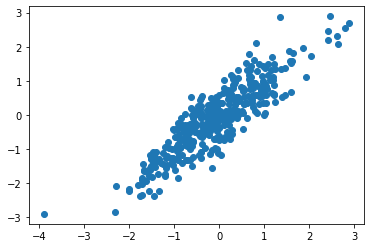

In [23]:
import matplotlib.pyplot as plt
plt.scatter(y_pred_base, y_test_emissions)

## Conclusion
La regression lineaire donne des resultats aberrants, pour mieux comprendre la cause de ces scores, on regardes les coefficients des variables de regression

### Coefficients des variables
Afin de comprendre l'importance des variables dans la prediction de la variable cible on regarde les coefficients de la regression. Je vais mettre les coefficients des regressions lineaire Ridge et Lasso dans un meme DataFrame afin de pouvoir comparer la performence et la decision de chaque methode

In [24]:
importance = lr.coef_

In [25]:
imp=pd.DataFrame()
imp['Feature']=X_train.columns
imp['LinearRegression']=importance

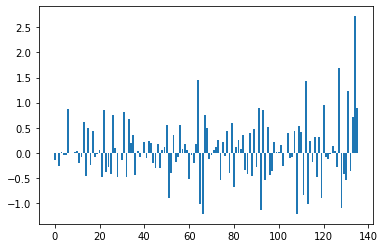

In [26]:
import matplotlib.pyplot as plt
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [27]:
imp.describe()

,LinearRegression
count,136.000000
mean,0.043735
std,0.568937
min,-1.220614
25%,-0.285888
50%,-0.000501
75%,0.324162
max,2.722955


## Interpretation 
On voit bien ici que les resultats sont du aux gros poids des coefficients. En effet,  les coefficients ont des poids tres importants et donc agissent d'une facon extreme sur les predictions d'ou les scores tres importants dans les indicateurs d'erreurs. Cela est surtout du au fait qu'il existe des correlations entres les variables. Pour gerer la multicollinearite, on essaie les regressions Ridge et Lasso qui effectuent des regularisations sur l'erreur quadratique (l2) ou lineaire (l1)

In [28]:
negReg=imp.sort_values(by='LinearRegression').head(15)

In [29]:
posReg=imp.sort_values(by='LinearRegression', ascending=False).head(15)

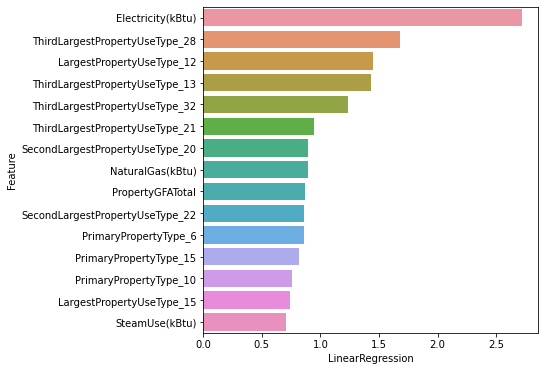

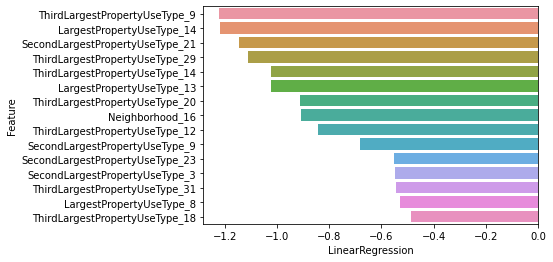

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
ax=sns.barplot(x='LinearRegression',y='Feature', data = posReg) 
plt.show()
ax=sns.barplot(x='LinearRegression',y='Feature', data = negReg) 

## 3- Regression ridge



Recherche des hyperparametres avec GridSearchCV

In [31]:
n_alphas = 200
alphas = np.logspace(-5, 5, n_alphas)

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
ridge=Ridge()
param = {
    'alpha':alphas,
    'fit_intercept':[True,False],
          }
search = GridSearchCV(ridge, param, scoring='r2', n_jobs=-1, cv=5)


In [32]:
searchTable=pd.DataFrame()

In [33]:
searchTable.loc['Model',2]='Ridge'
start_time=timeit.default_timer()
result = search.fit(X_train, y_emissions)
elapsed = timeit.default_timer() - start_time
searchTable.loc['Search Time',2]=elapsed
print ("The time of execution is {:.2f}s".format(elapsed))

The time of execution is 39.58s


In [34]:
def bestScore(model, i):
    searchTable.loc['Best Score',i]=model.best_score_
    #searchTable.loc['Best Hyperparameters',i]=model.best_params_
    print('Best Score: %s' % model.best_score_)
    print('Best Hyperparameters: %s' % model.best_params_)

In [35]:
bestScore(search,2)

Best Score: 0.7686394911323411
Best Hyperparameters: {'alpha': 4.768611697714475, 'fit_intercept': True}


In [36]:
Model= result.best_estimator_

In [37]:
score.loc['Model',2]='Ridge'
start_time=timeit.default_timer()
Model.fit(X_train,y_emissions)
ypredRidge=Model.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time',2]=elapsed
print ("The time of execution is {:.2f}s".format(elapsed))

The time of execution is 0.05s


In [38]:
get_score(y_test_emissions,ypredRidge,2)

MSE : 0.22
RMSE : 0.47
MAE : 0.37


In [39]:
get_r2(Model,X_test, y_test_emissions, 2)

R2 : 0.78130


## Conclusion
On voit bien que le score de la regression Ridge presente une nette amelioration de la regression lineaire. Nous allons regarder les coefficients des variables par la regression Ridge

In [40]:
importance = Model.coef_
imp['Ridge']=importance


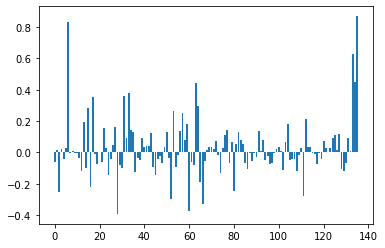

In [41]:
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [42]:
imp.describe()

,LinearRegression,Ridge
count,136.000000,136.000000
mean,0.043735,0.027036
std,0.568937,0.180268
min,-1.220614,-0.393251
25%,-0.285888,-0.063358
50%,-0.000501,0.005805
75%,0.324162,0.080266
max,2.722955,0.869535


On voit bien que les coefficients dans la regression Ridge sont beaucoup plus equilibres

In [137]:
posRidge=imp[['Feature','Ridge']].sort_values(by="Ridge", ascending=False).head(10)

In [138]:
negRidge=imp[['Feature','Ridge']].sort_values(by="Ridge").head(10)

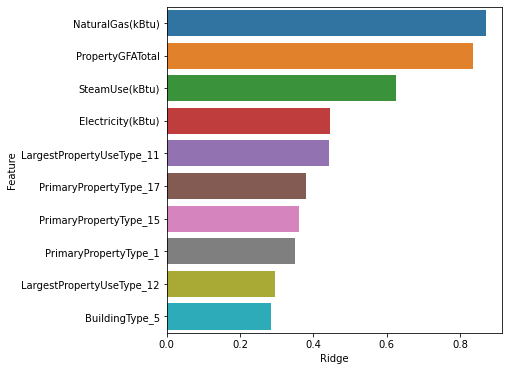

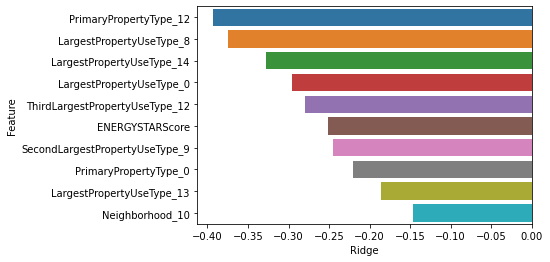

In [139]:
import matplotlib.pyplot as plt
import seaborn as sns
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
ax=sns.barplot(x='Ridge',y='Feature', data = posRidge) 
plt.show()
ax=sns.barplot(x='Ridge',y='Feature', data = negRidge) 

# Interpretation local des feature importances en utilisant Lime

In [46]:
from lime import lime_tabular

In [47]:
explainer = lime_tabular.LimeTabularExplainer(X_train.values, mode="regression", feature_names= X_train.columns)

## Etude locale sur l'instance avec erreur maximale 

In [48]:
max_idx=np.argmax(abs(ypredRidge-y_test_emissions))

In [49]:
print("Erreur maximale absolue :", abs(ypredRidge-y_test_emissions).max())
print("Prediction : ", Model.predict(X_test.values[max_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[max_idx])


Erreur maximale absolue : 1.565079305313605
Prediction :  [1.32001362]
Valeur exacte :  2.8850929206549862


In [50]:
explanation = explainer.explain_instance(X_test.values[max_idx], Model.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

## Etude locale sur l'instance avec erreur minimale 

In [51]:
min_idx=np.argmin(abs(ypredRidge-y_test_emissions))

In [52]:
print("Erreur minimale absolue :", abs(ypredRidge-y_test_emissions).min())
print("Prediction : ", Model.predict(X_test.values[min_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[min_idx])


Erreur minimale absolue : 0.0017682589369687474
Prediction :  [-0.63507508]
Valeur exacte :  -0.6368433429760408


In [53]:
explanation = explainer.explain_instance(X_test.values[min_idx], Model.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

# Lasso
La regression Lasso permet de faire une selection de variables en eliminant des variables correlees. Nous allons comparer la performance de la regression Lasso a celle de Ridge

Recherche des hyperparametres avec GridSearchCV

In [54]:
from sklearn.linear_model import Lasso
n_alphas = 300
alphas = np.logspace(-5, 1, n_alphas)
param = {
    'alpha':alphas,
    'fit_intercept':[True,False],
          }
lasso=Lasso()
search = GridSearchCV(lasso, param, scoring='r2', n_jobs=-1, cv=5)


In [55]:
searchTable.loc['Model',3]='Lasso'
start_time=timeit.default_timer()
result = search.fit(X_train, y_emissions)
elapsed = timeit.default_timer() - start_time
searchTable.loc['Search Time',3]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))

The time of execution of above program is 119.97s


In [56]:
bestScore(search,3)

Best Score: 0.7694930153111622
Best Hyperparameters: {'alpha': 0.001851648417912156, 'fit_intercept': True}


In [57]:
Model_lasso= result.best_estimator_

In [58]:
score.loc['Model',3]='Lasso'
start_time=timeit.default_timer()
Model_lasso.fit(X_train,y_emissions)
ypred_Lasso=Model_lasso.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time',3]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))


The time of execution of above program is 0.16s


In [59]:
get_score(y_test_emissions,ypred_Lasso,3 )

MSE : 0.22
RMSE : 0.46
MAE : 0.37


In [60]:
get_r2(Model_lasso,X_test, y_test_emissions,3)

R2 : 0.78407


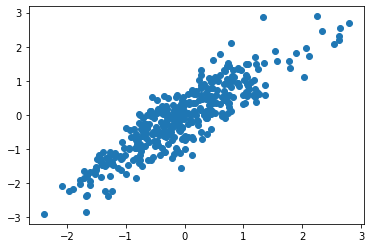

In [61]:
plt.scatter(ypred_Lasso,y_test_emissions )

## Conclusion
On voit bien que le score de la regression Lasso est tres proche du score de la regression Ridge, par contre le traietement des coefficients de variables est different

## Coefficients des variables Lasso

In [62]:
importance = Model_lasso.coef_

In [63]:
imp['Lasso']=importance

In [64]:
imp.describe()

,LinearRegression,Ridge,Lasso
count,136.000000,136.000000,136.000000
mean,0.043735,0.027036,0.032067
std,0.568937,0.180268,0.202935
min,-1.220614,-0.393251,-0.500056
25%,-0.285888,-0.063358,0.000000
50%,-0.000501,0.005805,0.000000
75%,0.324162,0.080266,0.000000
max,2.722955,0.869535,1.235740


On voit bien ici que pour la regression Lasso il y a des variables dont le coefficient passe a 0. Il y a donc automatiquement une reduction du nombre de variables

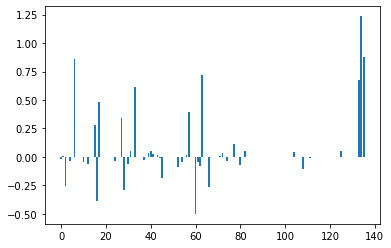

In [65]:
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [66]:
selected_Lasso=imp[(imp['Lasso']!=0)]['Feature'].values

In [67]:
len(selected_Lasso)

48

Le model Lasso est donc base sur la selection de 82 variables a partir des 193

In [68]:
negLasso=imp[['Feature','Lasso']].sort_values(by='Lasso').head(10)

In [69]:
posLasso=imp[['Feature','Lasso']].sort_values(by='Lasso', ascending=False).head(10)

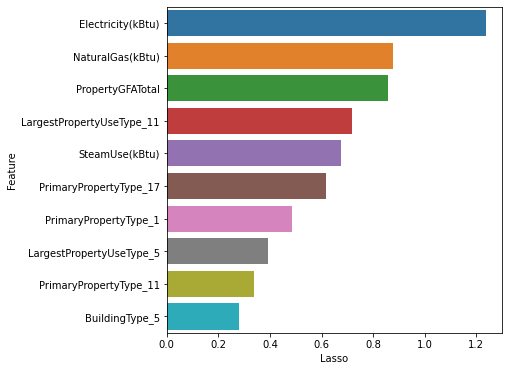

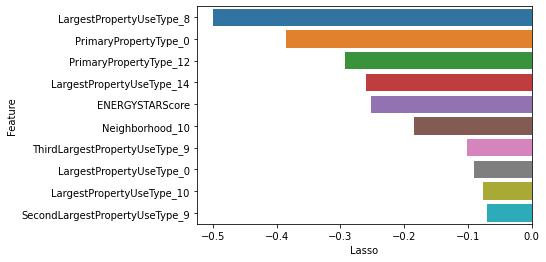

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
sns.barplot(x='Lasso',y='Feature', data = posLasso) 
plt.show()
sns.barplot(x='Lasso',y='Feature', data = negLasso) 
plt.show()

# Etude locale des feature importances 

## Instance avec erreur maximale de prediction

In [71]:
max_idx=np.argmax(abs(ypred_Lasso-y_test_emissions))
print("Erreur maximale absolue :", abs(ypred_Lasso-y_test_emissions).max())
print("Prediction : ", Model_lasso.predict(X_test.values[max_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[max_idx])

explanation = explainer.explain_instance(X_test.values[max_idx], Model_lasso.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur maximale absolue : 1.5596060779023098
Prediction :  [1.32548684]
Valeur exacte :  2.8850929206549862


## Instance avec erreur minimale de prediction

In [72]:
min_idx=np.argmin(abs(ypred_Lasso-y_test_emissions))
print("Erreur minimale absolue :", abs(ypred_Lasso-y_test_emissions).min())
print("Prediction : ", Model_lasso.predict(X_test.values[min_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[min_idx])

explanation = explainer.explain_instance(X_test.values[min_idx], Model_lasso.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur minimale absolue : 0.000187151141034958
Prediction :  [-1.50862921]
Valeur exacte :  -1.5084420630702613


# 4- Decision tree regression

In [73]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor()

In [74]:
parameters={"splitter":["best","random"],
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10,20,30,40,50,60,70,80,90] }
from sklearn.model_selection import GridSearchCV
search=GridSearchCV(dtr,param_grid=parameters,scoring='r2',cv=3)

In [75]:
searchTable.loc['Model',4]='Decision Tree'
start_time=timeit.default_timer()
search.fit(X_train,y_emissions)
elapsed = timeit.default_timer() - start_time
searchTable.loc['Search Time',4]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))


The time of execution of above program is 941.57s


In [76]:
bestScore(search, 4)

Best Score: 0.5561614817198094
Best Hyperparameters: {'max_depth': 7, 'max_features': None, 'max_leaf_nodes': 50, 'min_samples_leaf': 3, 'min_weight_fraction_leaf': 0.1, 'splitter': 'random'}


In [77]:
best_tree = search.best_estimator_

In [78]:
score.loc['Model',4]='Decision Tree'
start_time=timeit.default_timer()
best_tree.fit(X_train, y_emissions)
y_pred_tree=best_tree.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time',4]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))

The time of execution of above program is 0.02s


In [79]:
get_score(y_test_emissions, y_pred_tree,4)

MSE : 0.48
RMSE : 0.69
MAE : 0.53


In [80]:
get_r2(best_tree, X_test, y_test_emissions, 4)

R2 : 0.52410


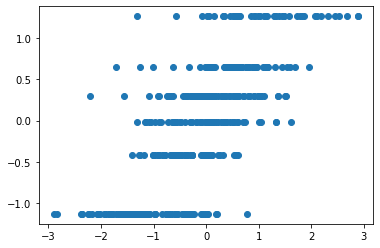

In [81]:
plt.scatter(y_test_emissions, y_pred_tree)

## Feature importance

In [82]:
importance=best_tree.feature_importances_

In [83]:
imp['Decision Tree']=importance

In [84]:
tree_feat=imp[['Feature','Decision Tree']][imp['Decision Tree']!=0].sort_values(by='Decision Tree', ascending=False)

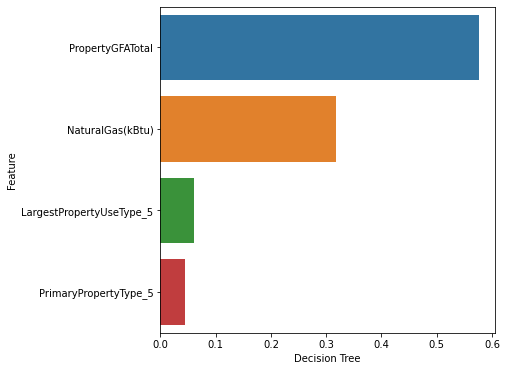

In [85]:
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
ax=sns.barplot(x='Decision Tree',y='Feature', data = tree_feat) 
plt.show()

# Etude locale des features importances

## Instance avec erreur minimale de prediction

In [86]:
min_idx=np.argmin(abs(y_pred_tree-y_test_emissions))
print("Erreur minimale absolue :", abs(y_pred_tree-y_test_emissions).min())
print("Prediction : ", best_tree.predict(X_test.values[min_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[min_idx])

explanation = explainer.explain_instance(X_test.values[min_idx], best_tree.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur minimale absolue : 0.003337592525795019
Prediction :  [0.64931885]
Valeur exacte :  0.6526564400847759


## Instance avec erreur maximale de prediction

In [87]:
max_idx=np.argmax(abs(y_pred_tree-y_test_emissions))
print("Erreur maximale absolue :", abs(y_pred_tree-y_test_emissions).max())
print("Prediction : ", best_tree.predict(X_test.values[max_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[max_idx])

explanation = explainer.explain_instance(X_test.values[max_idx], best_tree.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur maximale absolue : 2.58324573212919
Prediction :  [1.26320591]
Valeur exacte :  -1.32003982226743


# 5- Random Forest Regression

In [88]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
rf = RandomForestRegressor()

In [89]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


In [90]:
search = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 80, cv = 3, verbose=2, random_state=42, n_jobs = -1)

In [91]:
searchTable.loc['Model',5]='Random Forest'
start_time=timeit.default_timer()
search.fit(X_train, y_emissions)
elapsed = timeit.default_timer() - start_time
searchTable.loc['Search Time',5]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))


Fitting 3 folds for each of 80 candidates, totalling 240 fits
The time of execution of above program is 627.22s


In [92]:
bestScore(search, 5)

Best Score: 0.7267783300649361
Best Hyperparameters: {'n_estimators': 1400, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 100, 'bootstrap': True}


In [93]:
best_forest = search.best_estimator_

In [94]:
score.loc['Model',5]='Random Forest'
start_time=timeit.default_timer()
best_forest.fit(X_train, y_emissions)
y_pred_forest=best_forest.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time', 5]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))

The time of execution of above program is 16.92s


In [95]:
get_score(y_test_emissions, y_pred_forest,5)

MSE : 0.22
RMSE : 0.47
MAE : 0.35


In [96]:
get_r2(best_forest, X_test, y_test_emissions, 5)

R2 : 0.78361


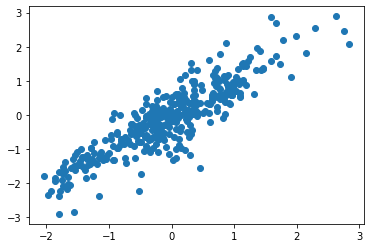

In [97]:
plt.scatter(y_pred_forest, y_test_emissions)

## Feature importance

In [98]:
importance=best_forest.feature_importances_
imp['Random Forest']=importance
imp.describe()

,LinearRegression,Ridge,Lasso,Decision Tree,Random Forest
count,136.000000,136.000000,136.000000,136.000000,1.360000e+02
mean,0.043735,0.027036,0.032067,0.007353,7.352941e-03
std,0.568937,0.180268,0.202935,0.056589,4.173532e-02
min,-1.220614,-0.393251,-0.500056,0.000000,5.729692e-07
25%,-0.285888,-0.063358,0.000000,0.000000,7.029634e-05
50%,-0.000501,0.005805,0.000000,0.000000,4.914956e-04
75%,0.324162,0.080266,0.000000,0.000000,1.231686e-03
max,2.722955,0.869535,1.235740,0.576819,4.463879e-01


In [134]:
forest_feat=imp[['Feature', 'Random Forest']][imp['Random Forest']>0.005].sort_values(by='Random Forest', ascending=False).head(10)

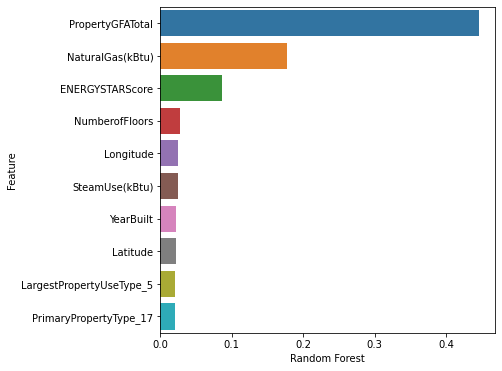

In [135]:
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
ax=sns.barplot(x='Random Forest',y='Feature', data = forest_feat) 
plt.show()

# Etude local des feature importances

## Instance avec erreur maximale de prediction

In [101]:
max_idx=np.argmax(abs(y_pred_forest -y_test_emissions))
print("Erreur maximale absolue :", abs(y_pred_forest-y_test_emissions).max())
print("Prediction : ", best_forest.predict(X_test.values[max_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[max_idx])

explanation = explainer.explain_instance(X_test.values[max_idx], best_forest.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur maximale absolue : 2.0204059231294202
Prediction :  [0.45538626]
Valeur exacte :  -1.5650196607050304


## Instance avec erreur minimale de prediction

In [102]:
min_idx=np.argmin(abs(y_pred_forest -y_test_emissions))
print("Erreur minimale absolue :", abs(y_pred_forest-y_test_emissions).min())
print("Prediction : ", best_forest.predict(X_test.values[min_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[min_idx])

explanation = explainer.explain_instance(X_test.values[min_idx], best_forest.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur minimale absolue : 0.000199587615378638
Prediction :  [1.59147833]
Valeur exacte :  1.59167792053624


# 6- XgBoost

In [103]:
import xgboost as xgb
from scipy.stats import uniform,loguniform, randint

In [104]:
param_grid = {
    "learning_rate": [0.05,0.10,0.15,0.20,0.25,0.30],
    "max_depth" : [ 3, 4, 5, 6, 8, 10, 12, 15],
    "colsample_bytree" : [ 0.3, 0.4, 0.5 , 0.7 ],
    "n_estimators": [200, 500, 1000, 1500, 2000]
}

# Random
search = RandomizedSearchCV(xgb.XGBRegressor(), param_distributions=param_grid,
                        n_iter = 80,  cv=3, n_jobs=8, scoring='r2')

In [105]:
searchTable.loc['Model', 6]='XgBoost'
start_time=timeit.default_timer()
model_xgboost = search.fit(X_train, y_emissions)
elapsed = timeit.default_timer() - start_time
searchTable.loc['Search Time',6]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))

The time of execution of above program is 343.22s


In [106]:
bestScore(model_xgboost, 6)

Best Score: 0.7643515007703378
Best Hyperparameters: {'n_estimators': 500, 'max_depth': 3, 'learning_rate': 0.1, 'colsample_bytree': 0.5}


In [107]:
best_boost= model_xgboost.best_estimator_

In [108]:
score.loc['Model',6]='XgBoost'
start_time=timeit.default_timer()
best_boost.fit(X_train, y_emissions)
ypreds_boost = best_boost.predict(X_test)
elapsed = timeit.default_timer() - start_time
score.loc['Time',6]=elapsed
print ("The time of execution of above program is {:.2f}s".format(elapsed))

The time of execution of above program is 1.49s


In [109]:
get_score(y_test_emissions, ypreds_boost,6)

MSE : 0.21
RMSE : 0.46
MAE : 0.35


In [110]:
get_r2(best_boost,X_test, y_test_emissions, 6)

R2 : 0.78964


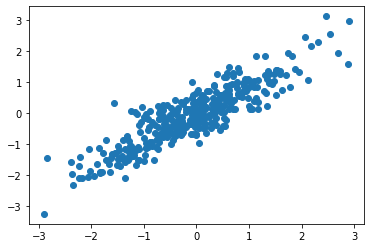

In [111]:
plt.scatter(y_test_emissions, ypreds_boost)

In [112]:
importance=best_boost.feature_importances_
imp['XgBoost']=importance
imp.describe()

,LinearRegression,Ridge,Lasso,Decision Tree,Random Forest,XgBoost
count,136.000000,136.000000,136.000000,136.000000,1.360000e+02,136.000000
mean,0.043735,0.027036,0.032067,0.007353,7.352941e-03,0.007353
std,0.568937,0.180268,0.202935,0.056589,4.173532e-02,0.020604
min,-1.220614,-0.393251,-0.500056,0.000000,5.729692e-07,0.000000
25%,-0.285888,-0.063358,0.000000,0.000000,7.029634e-05,0.000262
50%,-0.000501,0.005805,0.000000,0.000000,4.914956e-04,0.002005
75%,0.324162,0.080266,0.000000,0.000000,1.231686e-03,0.004492
max,2.722955,0.869535,1.235740,0.576819,4.463879e-01,0.149090


In [113]:
xgb_feat=imp[['Feature','XgBoost']][imp['XgBoost']>0.01].sort_values(by='XgBoost', ascending=False).head(10)

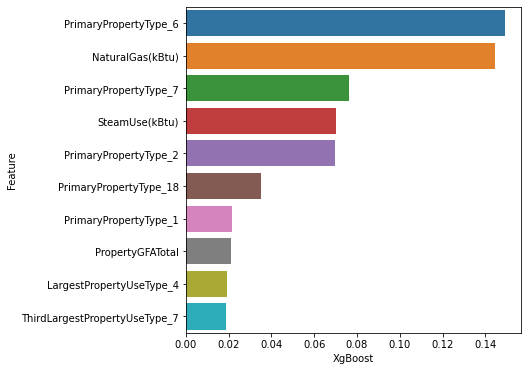

In [114]:
fig = plt.figure(figsize=(6, 6))
#ax = fig.add_subplot(1,2,2)
ax=sns.barplot(x='XgBoost',y='Feature', data = xgb_feat) 
plt.show()

# Etude local des feature importances

## Instance avec erreur maximale de prediction

In [115]:
max_idx=np.argmax(abs(ypreds_boost -y_test_emissions))
print("Erreur maximale absolue :", abs(ypreds_boost-y_test_emissions).max())
print("Prediction : ", best_boost.predict(X_test.values[max_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[max_idx])

explanation = explainer.explain_instance(X_test.values[max_idx], best_boost.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur maximale absolue : 1.8994549448427562
Prediction :  [0.33443528]
Valeur exacte :  -1.5650196607050304


## Instance avec erreur minimale de prediction

In [116]:
min_idx=np.argmin(abs(ypreds_boost -y_test_emissions))
print("Erreur minimale absolue :", abs(ypreds_boost-y_test_emissions).min())
print("Prediction : ", best_boost.predict(X_test.values[min_idx].reshape(1,-1)))
print("Valeur exacte : ", y_test_emissions[min_idx])

explanation = explainer.explain_instance(X_test.values[min_idx], best_boost.predict, num_features=len(X_train.columns))
explanation.show_in_notebook()

Erreur minimale absolue : 0.0002352901501243565
Prediction :  [1.3616914]
Valeur exacte :  1.3619266458553856


# Synthese des resutats de performence pour les methodes de regression

In [117]:
score=score.transpose()
score

,Model,Time,MSE,RMSE,MAE,R2
0,Dummy,0.004153,1.011888,1.005927,0.789164,-0.010729
1,Linear Regression,0.148298,0.217694,0.466576,0.368695,0.782556
2,Ridge,0.049332,0.218946,0.467917,0.370538,0.781305
3,Lasso,0.16051,0.216182,0.464954,0.365359,0.784065
4,Decision Tree,0.020169,0.476446,0.690251,0.530465,0.5241
5,Random Forest,16.924327,0.216635,0.465441,0.348071,0.783613
6,XgBoost,1.491865,0.2106,0.458912,0.349464,0.789641


In [118]:
searchTable

,2,3,4,5,6
Model,Ridge,Lasso,Decision Tree,Random Forest,XgBoost
Search Time,39.584624,119.970718,941.570203,627.21644,343.217671
Best Score,0.768639,0.769493,0.556161,0.726778,0.764352


## Temps de recherche de l'hyperparametre par methode

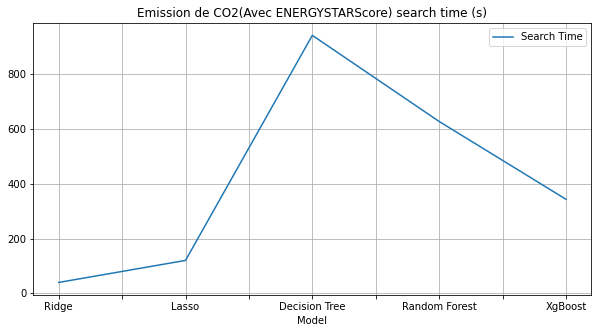

In [119]:
searchTable=searchTable.transpose()
ax=searchTable[["Model","Search Time"]].plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Emission de CO2(Avec ENERGYSTARScore) search time (s)")

## Comparaison de performence entre Train et Test set 

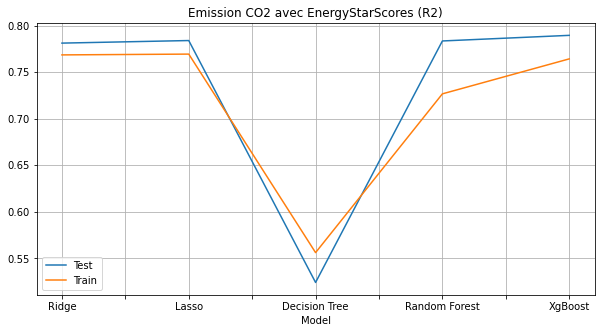

In [120]:
comparaison=pd.DataFrame()
comparaison['Model']=searchTable['Model']
comparaison['Test']=score['R2']
comparaison['Train']=searchTable['Best Score']
ax=comparaison.plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Emission CO2 avec EnergyStarScores (R2)")

# Comparaison entre performence de prediction de l'emission de CO2 avec et sans ENERGYSTARScore

In [121]:
scoreEm=pd.read_csv('scoreEmission.csv', sep=',')

In [122]:
searchEm=pd.read_csv('searchTableEmission.csv', sep=',')

In [123]:
scoreEm

,Unnamed: 0,Model,Time,MSE,RMSE,MAE,R2
0,0,Dummy,0.000575,1.027340e+00,1.013578e+00,8.074774e-01,-4.352221e-04
1,1,Linear Regression,0.039536,8.323272e+18,2.885008e+09,1.924881e+08,-8.105298e+18
2,2,Ridge,0.037938,2.969256e-01,5.449088e-01,4.220340e-01,7.108505e-01
3,3,Lasso,0.467231,3.069334e-01,5.540157e-01,4.251703e-01,7.011047e-01
4,4,Decision Tree,0.017900,4.497558e-01,6.706384e-01,5.175945e-01,5.620226e-01
5,5,Random Forest,18.647228,3.000062e-01,5.477282e-01,4.120306e-01,7.078505e-01
6,6,XgBoost,0.865007,2.963718e-01,5.444004e-01,4.083971e-01,7.113898e-01


In [124]:
score1=score.drop(columns=['MSE', 'MAE'])
score1.transpose()

,0,1,2,3,4,5,6
Model,Dummy,Linear Regression,Ridge,Lasso,Decision Tree,Random Forest,XgBoost
Time,0.004153,0.148298,0.049332,0.16051,0.020169,16.924327,1.491865
RMSE,1.005927,0.466576,0.467917,0.464954,0.690251,0.465441,0.458912
R2,-0.010729,0.782556,0.781305,0.784065,0.5241,0.783613,0.789641


In [125]:
searchEm


,Unnamed: 0,Model,Search Time,Best Score
0,2,Ridge,41.837421,0.711930
1,3,Lasso,210.189438,0.708474
2,4,Decision Tree,1434.754854,0.542290
3,5,Random Forest,1171.134460,0.693262
4,6,XgBoost,832.490669,0.704748


In [126]:
searchEm=searchEm.set_index('Unnamed: 0')
searchEm

,Model,Search Time,Best Score
Unnamed: 0,,,
2,Ridge,41.837421,0.711930
3,Lasso,210.189438,0.708474
4,Decision Tree,1434.754854,0.542290
5,Random Forest,1171.134460,0.693262
6,XgBoost,832.490669,0.704748


In [127]:
searchTable

,Model,Search Time,Best Score
2,Ridge,39.584624,0.768639
3,Lasso,119.970718,0.769493
4,Decision Tree,941.570203,0.556161
5,Random Forest,627.21644,0.726778
6,XgBoost,343.217671,0.764352


## Calcul du pourcentage d'amelioration apres ajout de ENERGYSTARScore

In [128]:
EnergyImp=pd.DataFrame()
EnergyImp['Model']=searchTable['Model']
EnergyImp['Train set sans ENERGYSTARSCORE(R2)']=searchEm['Best Score']
EnergyImp['Train set avec ENERGYSTARSCORE(R2)']=searchTable['Best Score']
EnergyImp['Train difference percentage']=100*(EnergyImp['Train set avec ENERGYSTARSCORE(R2)']-EnergyImp['Train set sans ENERGYSTARSCORE(R2)'])/EnergyImp['Train set sans ENERGYSTARSCORE(R2)']
EnergyImp['Test set sans ENERGYSTARSCORE(R2)']=scoreEm['R2']
EnergyImp['Test set avec ENERGYSTARSCORE(R2)']=score['R2']
EnergyImp['Test difference percentage']=100*(EnergyImp['Test set avec ENERGYSTARSCORE(R2)']-EnergyImp['Test set sans ENERGYSTARSCORE(R2)'])/EnergyImp['Test set sans ENERGYSTARSCORE(R2)']

EnergyImp

,Model,Train set sans ENERGYSTARSCORE(R2),Train set avec ENERGYSTARSCORE(R2),Train difference percentage,Test set sans ENERGYSTARSCORE(R2),Test set avec ENERGYSTARSCORE(R2),Test difference percentage
2,Ridge,0.711930,0.768639,7.965625,0.710850,0.781305,9.911271
3,Lasso,0.708474,0.769493,8.612765,0.701105,0.784065,11.83284
4,Decision Tree,0.542290,0.556161,2.557991,0.562023,0.5241,-6.747607
5,Random Forest,0.693262,0.726778,4.834648,0.707851,0.783613,10.703187
6,XgBoost,0.704748,0.764352,8.45749,0.711390,0.789641,10.999821


In [129]:
performance=EnergyImp.drop(columns=['Train set sans ENERGYSTARSCORE(R2)','Train set avec ENERGYSTARSCORE(R2)','Test set sans ENERGYSTARSCORE(R2)','Test set avec ENERGYSTARSCORE(R2)'])
performance

,Model,Train difference percentage,Test difference percentage
2,Ridge,7.965625,9.911271
3,Lasso,8.612765,11.83284
4,Decision Tree,2.557991,-6.747607
5,Random Forest,4.834648,10.703187
6,XgBoost,8.45749,10.999821


<AxesSubplot:title={'center':'Differences de score avec\\sans EnergyStarScores (R2)'}, xlabel='Model'>

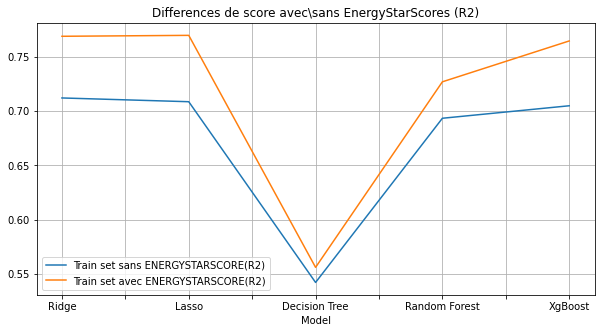

In [130]:
EnergyImp[['Model', 'Train set sans ENERGYSTARSCORE(R2)', 'Train set avec ENERGYSTARSCORE(R2)']].plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Differences de score avec\sans EnergyStarScores (R2)")

<AxesSubplot:title={'center':'Differences de score avec\\sans EnergyStarScores (R2)'}, xlabel='Model'>

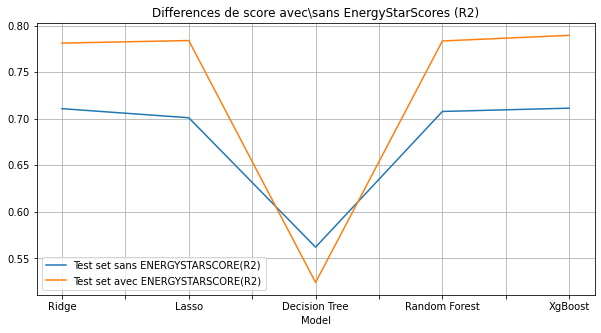

In [131]:
EnergyImp[['Model', 'Test set sans ENERGYSTARSCORE(R2)', 'Test set avec ENERGYSTARSCORE(R2)']].plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Differences de score avec\sans EnergyStarScores (R2)")

<AxesSubplot:title={'center':'Differences de score avec\\sans EnergyStarScores (R2)'}, xlabel='Model'>

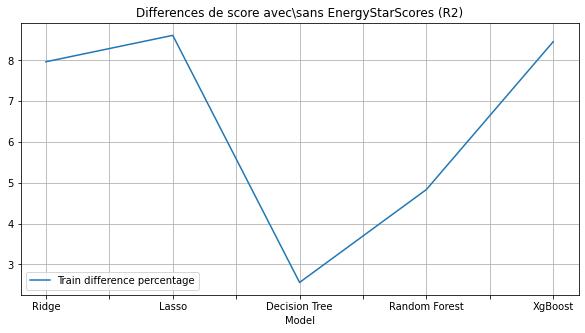

In [132]:
EnergyImp[['Model', 'Train difference percentage']].plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Differences de score avec\sans EnergyStarScores (R2)")

<AxesSubplot:title={'center':'Differences de score avec\\sans EnergyStarScores (R2)'}, xlabel='Model'>

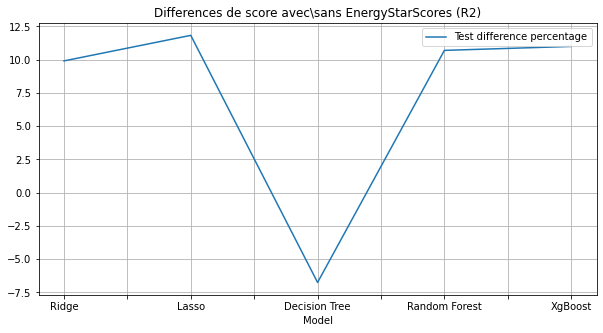

In [133]:
EnergyImp[['Model', 'Test difference percentage']].plot(kind="line", x="Model", figsize=(10,5), grid=True, title="Differences de score avec\sans EnergyStarScores (R2)")